# HLS L30

### Data Prep -- data stack

In [1]:
import os, re, glob
import numpy as np
import rasterio

HLS_DIR = r"C:\Users\carellano.LEGION5PRO-O3OB\Documents\GitHub\SR_dataaccess\data_hls_graz"

OUT_INPUTS = os.path.join(HLS_DIR, "model_inputs_dn_batch")
OUT_PREDS  = os.path.join(HLS_DIR, "preds_dn_batch")
os.makedirs(OUT_INPUTS, exist_ok=True)
os.makedirs(OUT_PREDS, exist_ok=True)

bands = ["B02","B03","B04","B05","B06","B07"]
t2m_c = 20.0   # placeholder for now (we’ll swap to ERA5/INCA later)

print("HLS_DIR:", HLS_DIR)
print("OUT_INPUTS:", OUT_INPUTS)
print("OUT_PREDS:", OUT_PREDS)


HLS_DIR: C:\Users\carellano.LEGION5PRO-O3OB\Documents\GitHub\SR_dataaccess\data_hls_graz
OUT_INPUTS: C:\Users\carellano.LEGION5PRO-O3OB\Documents\GitHub\SR_dataaccess\data_hls_graz\model_inputs_dn_batch
OUT_PREDS: C:\Users\carellano.LEGION5PRO-O3OB\Documents\GitHub\SR_dataaccess\data_hls_graz\preds_dn_batch


#### all unique L30 acquisitions

In [2]:
def find_l30_prefixes(hls_dir, required_bands):
    b02_files = glob.glob(os.path.join(hls_dir, "HLS.L30.*.B02.tif"))
    prefixes = sorted([os.path.basename(f).replace(".B02.tif","") for f in b02_files])

    def has_all(prefix):
        return all(os.path.exists(os.path.join(hls_dir, f"{prefix}.{b}.tif")) for b in required_bands)

    prefixes = [p for p in prefixes if has_all(p)]
    return prefixes

prefixes = find_l30_prefixes(HLS_DIR, bands)
print("✅ L30 acquisitions with full band set:", len(prefixes))
print("First 5:")
for p in prefixes[:5]:
    print(" -", p)



✅ L30 acquisitions with full band set: 12
First 5:
 - HLS.L30.T33TWM.2022122T094520.v2.0
 - HLS.L30.T33TWM.2022130T094530.v2.0
 - HLS.L30.T33TWM.2022131T093904.v2.0
 - HLS.L30.T33TWM.2022153T095148.v2.0
 - HLS.L30.T33TWM.2022154T094508.v2.0


#### stacking the L30

In [3]:
def write_dn_stack(prefix, hls_dir, out_dir, bands, t2m_c=20.0):
    band_arrays = []
    profile = None
    height = width = None

    for i, band in enumerate(bands):
        path = os.path.join(hls_dir, f"{prefix}.{band}.tif")
        with rasterio.open(path) as src:
            arr = src.read(1).astype(np.float32)
            nod = src.nodata
            if nod is not None:
                arr[arr == nod] = 0.0
            else:
                # fallback: HLS often uses -9999
                arr[arr <= -9990] = 0.0

            band_arrays.append(arr)

            if i == 0:
                profile = src.profile
                height, width = src.height, src.width

    band_arrays.append(np.full((height, width), t2m_c, dtype=np.float32))
    stack = np.stack(band_arrays, axis=0)

    profile.update(count=7, dtype="float32", nodata=None)

    out_path = os.path.join(out_dir, f"{prefix}.inputs.tif")
    with rasterio.open(out_path, "w", **profile) as dst:
        dst.write(stack)

    return out_path

written = []
for p in prefixes:
    out_path = write_dn_stack(p, HLS_DIR, OUT_INPUTS, bands, t2m_c=t2m_c)
    written.append(out_path)

print("✅ wrote stacks:", len(written))
print("Example stack:", written[0] if written else None)


✅ wrote stacks: 12
Example stack: C:\Users\carellano.LEGION5PRO-O3OB\Documents\GitHub\SR_dataaccess\data_hls_graz\model_inputs_dn_batch\HLS.L30.T33TWM.2022122T094520.v2.0.inputs.tif


In [6]:
## sanity check one file

sample = written[0]
with rasterio.open(sample) as src:
    arr = src.read().astype(np.float32)  # (7,H,W)
print("Stack shape:", arr.shape)
for i in range(arr.shape[0]):
    a = arr[i]
    print(i+1, "min/max/mean:", float(np.min(a)), float(np.max(a)), float(np.mean(a)))




Stack shape: (7, 3660, 3660)
1 min/max/mean: -2365.0 12483.0 2486.55712890625
2 min/max/mean: -917.0 12154.0 2716.08935546875
3 min/max/mean: -1081.0 12202.0 2597.236328125
4 min/max/mean: 0.0 12956.0 4405.62890625
5 min/max/mean: -62.0 16550.0 2272.3955078125
6 min/max/mean: -1045.0 17472.0 1767.927490234375
7 min/max/mean: 20.0 20.0 20.0


#### Loading the Model

In [5]:
#import sys

#!{sys.executable} -m pip install -U "terratorch==1.0.0" "lightning==2.2.5" "jsonargparse==4.27.7"


In [ ]:
#import sys
#!{sys.executable} -m pip uninstall -y torch torchvision torchaudio
#!{sys.executable} -m pip install --index-url https://download.pytorch.org/whl/cu124 torch torchvision torchaudio


Found existing installation: torch 2.10.0
Uninstalling torch-2.10.0:
  Successfully uninstalled torch-2.10.0
Found existing installation: torchvision 0.25.0
Uninstalling torchvision-0.25.0:
  Successfully uninstalled torchvision-0.25.0


You can safely remove it manually.
You can safely remove it manually.


Looking in indexes: https://download.pytorch.org/whl/cu124
   ---------------------------------------- 0.0/2.5 GB ? eta -:--:--
   ---------------------------------------- 0.0/2.5 GB 20.9 MB/s eta 0:02:01
   ---------------------------------------- 0.0/2.5 GB 21.3 MB/s eta 0:01:59
   ---------------------------------------- 0.0/2.5 GB 21.9 MB/s eta 0:01:55
   ---------------------------------------- 0.0/2.5 GB 21.0 MB/s eta 0:02:01
   ---------------------------------------- 0.0/2.5 GB 21.2 MB/s eta 0:01:59
   ---------------------------------------- 0.0/2.5 GB 21.5 MB/s eta 0:01:57
   ---------------------------------------- 0.0/2.5 GB 21.7 MB/s eta 0:01:56
    --------------------------------------- 0.0/2.5 GB 21.7 MB/s eta 0:01:56
    --------------------------------------- 0.0/2.5 GB 21.7 MB/s eta 0:01:55
    --------------------------------------- 0.0/2.5 GB 21.7 MB/s eta 0:01:55
    --------------------------------------- 0.0/2.5 GB 21.7 MB/s eta 0:01:55
    ---------------------

In [7]:
#check cuda

import torch
print("torch version:", torch.__version__)
print("cuda available:", torch.cuda.is_available())
print("cuda device count:", torch.cuda.device_count())
if torch.cuda.is_available():
    print("gpu:", torch.cuda.get_device_name(0))


torch version: 2.6.0+cu124
cuda available: True
cuda device count: 1
gpu: NVIDIA GeForce RTX 3070 Laptop GPU


In [8]:
import torch
from terratorch.models.model import AuxiliaryHead
from terratorch.tasks.tiled_inference import TiledInferenceParameters
torch.serialization.add_safe_globals([AuxiliaryHead, TiledInferenceParameters])

from huggingface_hub import hf_hub_download
from terratorch.cli_tools import LightningInferenceModel

ckpt_path = hf_hub_download(
    repo_id="ibm-granite/granite-geospatial-land-surface-temperature",
    filename="LST_model.ckpt",
)
config_path = hf_hub_download(
    repo_id="ibm-granite/granite-geospatial-land-surface-temperature",
    filename="config.yaml",
)

torch.set_float32_matmul_precision("high")  # Legion GPU speed boost
model = LightningInferenceModel.from_config(config_path, ckpt_path)
print("✅ Model loaded")


c:\Users\carellano.LEGION5PRO-O3OB\.conda\envs\py310_terratorch\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\carellano.LEGION5PRO-O3OB\.conda\envs\py310_terratorch\lib\site-packages\lightning\fabric\__init__.py:41: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
c:\Users\carellano.LEGION5PRO-O3OB\.conda\envs\py310_terratorch\lib\site-packages\lightning\pytorch\cli.py:520: LightningCLI's args parameter is intended to run from within Python like if it were from the command line. To prevent mistakes it is not recommended to provide both args and command line arguments, got: sys.argv[1:]=['--f=c:\\Users\\carellano.LEGION5PRO-O3O

✅ Model loaded


### Inference

In [9]:
import numpy as np

preds, input_files = model.inference_on_dir(OUT_INPUTS)
print("✅ Inference finished:", len(input_files))

saved = []
for pred, infile in zip(preds, input_files):
    pred_arr = np.asarray(pred).squeeze().astype(np.float32)
    base = os.path.basename(infile).replace(".inputs.tif", "")
    out_pred = os.path.join(OUT_PREDS, f"{base}.pred.tif")

    with rasterio.open(infile) as src:
        profile = src.profile
    profile.update(count=1, dtype="float32", nodata=None)

    with rasterio.open(out_pred, "w", **profile) as dst:
        dst.write(pred_arr, 1)

    saved.append(out_pred)

print("✅ Saved preds:", len(saved))
print("Example pred:", saved[0] if saved else None)


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Checking stackability.


c:\Users\carellano.LEGION5PRO-O3OB\.conda\envs\py310_terratorch\lib\site-packages\lightning\pytorch\trainer\connectors\data_connector.py:436: Consider setting `persistent_workers=True` in 'predict_dataloader' to speed up the dataloader worker initialization.


c:\Users\carellano.LEGION5PRO-O3OB\.conda\envs\py310_terratorch\lib\site-packages\rich\live.py:231: UserWarning: 
install "ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

✅ Inference finished: 12
✅ Saved preds: 12
Example pred: C:\Users\carellano.LEGION5PRO-O3OB\Documents\GitHub\SR_dataaccess\data_hls_graz\preds_dn_batch\HLS.L30.T33TWM.2022122T094520.v2.0.pred.tif


#### Visualize

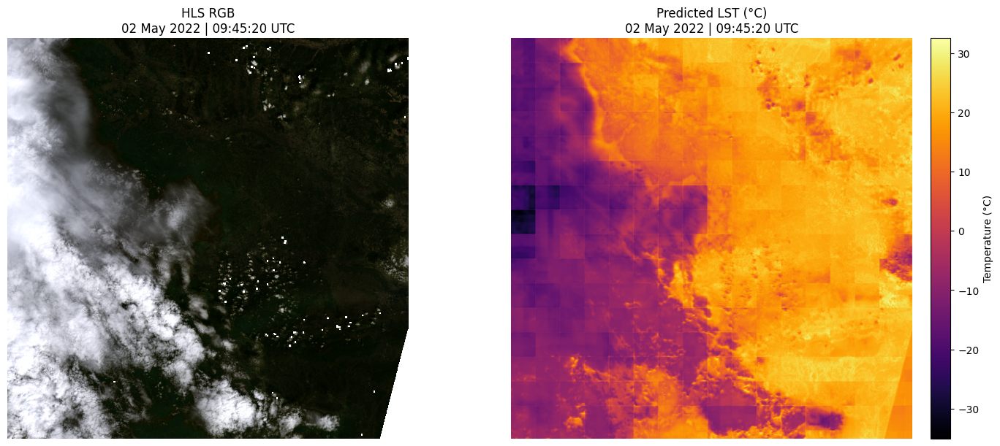

In [10]:
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

def parse_dt_from_prefix(prefix):
    # prefix contains token like 2022162T094544
    token = prefix.split(".")[3]
    year = int(token[:4]); jday = int(token[4:7])
    hh = int(token[8:10]); mm = int(token[10:12]); ss = int(token[12:14])
    dt = datetime(year, 1, 1) + timedelta(days=jday-1, hours=hh, minutes=mm, seconds=ss)
    return dt

def read_rgb_from_hls(prefix, hls_dir):
    # RGB = B04,B03,B02 (red,green,blue)
    paths = [os.path.join(hls_dir, f"{prefix}.B04.tif"),
             os.path.join(hls_dir, f"{prefix}.B03.tif"),
             os.path.join(hls_dir, f"{prefix}.B02.tif")]
    arrs = []
    for p in paths:
        with rasterio.open(p) as src:
            a = src.read(1).astype(np.float32)
            nod = src.nodata
            if nod is not None:
                a[a == nod] = np.nan
            else:
                a[a <= -9990] = np.nan
            # scale reflectance just for display (NOT for model)
            a = a * 0.0001
            arrs.append(a)
    rgb = np.stack(arrs, axis=-1)
    # simple stretch for view
    lo, hi = np.nanpercentile(rgb, 2), np.nanpercentile(rgb, 98)
    rgb = np.clip((rgb - lo) / (hi - lo + 1e-6), 0, 1)
    return rgb

def show_rgb_pred(prefix, hls_dir, pred_path):
    dt = parse_dt_from_prefix(prefix)
    title_dt = dt.strftime("%d %b %Y | %H:%M:%S UTC")

    rgb = read_rgb_from_hls(prefix, hls_dir)
    with rasterio.open(pred_path) as src:
        pred = src.read(1).astype(np.float32)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=True)

    ax1.imshow(rgb)
    ax1.set_title(f"HLS RGB\n{title_dt}")
    ax1.axis("off")

    im = ax2.imshow(pred, cmap="inferno")
    ax2.set_title(f"Predicted LST (°C)\n{title_dt}")
    ax2.axis("off")
    cbar = fig.colorbar(im, ax=ax2, fraction=0.046, pad=0.04)
    cbar.set_label("Temperature (°C)")

    plt.show()

# show one example (change index)
example_prefix = prefixes[0]
example_pred = os.path.join(OUT_PREDS, f"{example_prefix}.pred.tif")
show_rgb_pred(example_prefix, HLS_DIR, example_pred)


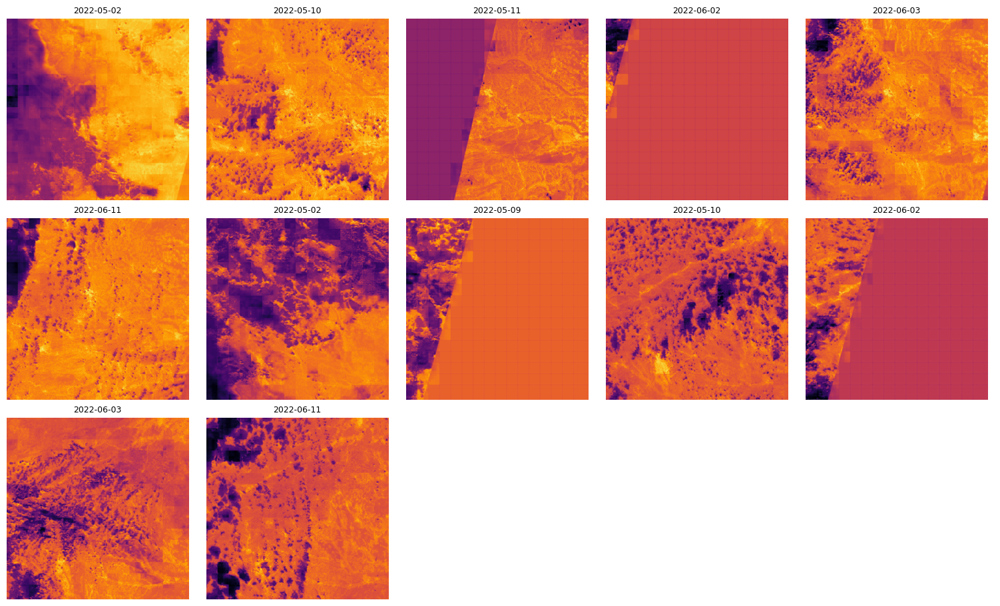

In [13]:
import math

def make_pred_contact_sheet(prefixes, out_preds, ncols=5, max_items=25):
    items = [p for p in prefixes if os.path.exists(os.path.join(out_preds, f"{p}.pred.tif"))]
    items = items[:max_items]
    n = len(items)
    nrows = math.ceil(n / ncols)

    fig, axes = plt.subplots(nrows, ncols, figsize=(3*ncols, 3*nrows), constrained_layout=True)
    axes = np.array(axes).reshape(-1)

    for i, p in enumerate(items):
        pred_path = os.path.join(out_preds, f"{p}.pred.tif")
        with rasterio.open(pred_path) as src:
            pred = src.read(1).astype(np.float32)

        dt = parse_dt_from_prefix(p).strftime("%Y-%m-%d")
        axes[i].imshow(pred, cmap="inferno")
        axes[i].set_title(dt, fontsize=9)
        axes[i].axis("off")

    for j in range(i+1, len(axes)):
        axes[j].axis("off")

    plt.show()

make_pred_contact_sheet(prefixes, OUT_PREDS, ncols=5, max_items=30)


In [14]:
import math
import matplotlib.pyplot as plt
import numpy as np
import rasterio
import os

def make_rgb_lst_grid(prefixes, hls_dir, out_preds, max_items=12):
    # only keep ones with predictions
    items = [p for p in prefixes if os.path.exists(os.path.join(out_preds, f"{p}.pred.tif"))]
    items = items[:max_items]

    n = len(items)
    nrows = min(12, n)
    ncols = 2

    # ---- First pass: compute global LST min/max for consistent colorbar ----
    all_vals = []
    for p in items:
        with rasterio.open(os.path.join(out_preds, f"{p}.pred.tif")) as src:
            a = src.read(1).astype(np.float32)
            a = a[np.isfinite(a)]
            if a.size > 0:
                all_vals.append(a)

    vmin = np.percentile(np.concatenate(all_vals), 2)
    vmax = np.percentile(np.concatenate(all_vals), 98)

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(10, 3*nrows),
        constrained_layout=True
    )

    if nrows == 1:
        axes = np.expand_dims(axes, 0)

    for i, p in enumerate(items):

        dt = parse_dt_from_prefix(p).strftime("%d %b %Y | %H:%M:%S UTC")

        # ---- RGB ----
        rgb = read_rgb_from_hls(p, hls_dir)
        axes[i, 0].imshow(rgb)
        axes[i, 0].set_title(f"{dt}", fontsize=9)
        axes[i, 0].axis("off")

        # ---- LST ----
        pred_path = os.path.join(out_preds, f"{p}.pred.tif")
        with rasterio.open(pred_path) as src:
            pred = src.read(1).astype(np.float32)

        im = axes[i, 1].imshow(pred, cmap="inferno", vmin=vmin, vmax=vmax)
        axes[i, 1].axis("off")

    # Turn off empty rows if fewer than 12
    for j in range(len(items), nrows):
        axes[j, 0].axis("off")
        axes[j, 1].axis("off")

    # Single colorbar for entire figure
    cbar = fig.colorbar(im, ax=axes[:,1], fraction=0.02, pad=0.01)
    cbar.set_label("Temperature (°C)")

    axes[0,0].set_title("HLS RGB", fontsize=11)
    axes[0,1].set_title("Predicted LST (°C)", fontsize=11)

    plt.show()


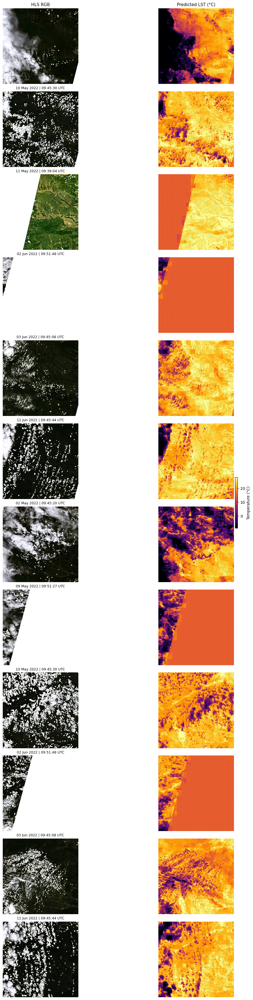

In [15]:
make_rgb_lst_grid(prefixes, HLS_DIR, OUT_PREDS, max_items=12)


#### Timeseries

In [11]:
import pandas as pd

# pick a fixed window (you can tweak)
row0, row1 = 1500, 2500
col0, col1 = 1500, 2500

rows = []
for p in prefixes:
    pred_path = os.path.join(OUT_PREDS, f"{p}.pred.tif")
    if not os.path.exists(pred_path):
        continue

    dt = parse_dt_from_prefix(p)
    with rasterio.open(pred_path) as src:
        aoi = src.read(1)[row0:row1, col0:col1].astype(np.float32)

    rows.append({
        "datetime_utc": dt,
        "mean_lst": float(np.nanmean(aoi)),
        "median_lst": float(np.nanmedian(aoi)),
        "prefix": p
    })

df_ts = pd.DataFrame(rows).sort_values("datetime_utc")
df_ts.head(), len(df_ts)


(         datetime_utc   mean_lst  median_lst  \
 0 2022-05-02 09:45:20  13.696190   16.895626   
 6 2022-05-02 09:45:20  12.102531   13.384809   
 7 2022-05-09 09:51:27  14.400157   14.489248   
 1 2022-05-10 09:45:30  23.939297   24.113499   
 8 2022-05-10 09:45:30  12.898368   15.678290   
 
                                prefix  
 0  HLS.L30.T33TWM.2022122T094520.v2.0  
 6  HLS.L30.T33TWN.2022122T094520.v2.0  
 7  HLS.L30.T33TWN.2022129T095127.v2.0  
 1  HLS.L30.T33TWM.2022130T094530.v2.0  
 8  HLS.L30.T33TWN.2022130T094530.v2.0  ,
 12)

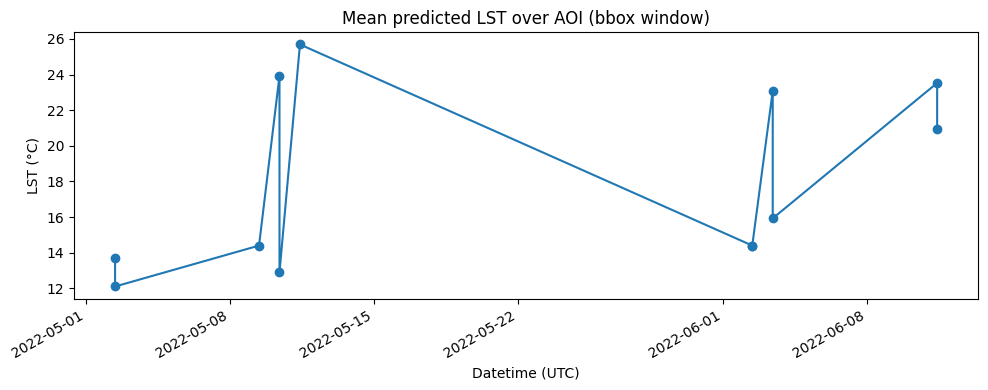

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))
plt.plot(df_ts["datetime_utc"], df_ts["mean_lst"], marker="o")
plt.title("Mean predicted LST over AOI (bbox window)")
plt.xlabel("Datetime (UTC)")
plt.ylabel("LST (°C)")
plt.xticks(rotation=30, ha="right")
plt.tight_layout()
plt.show()


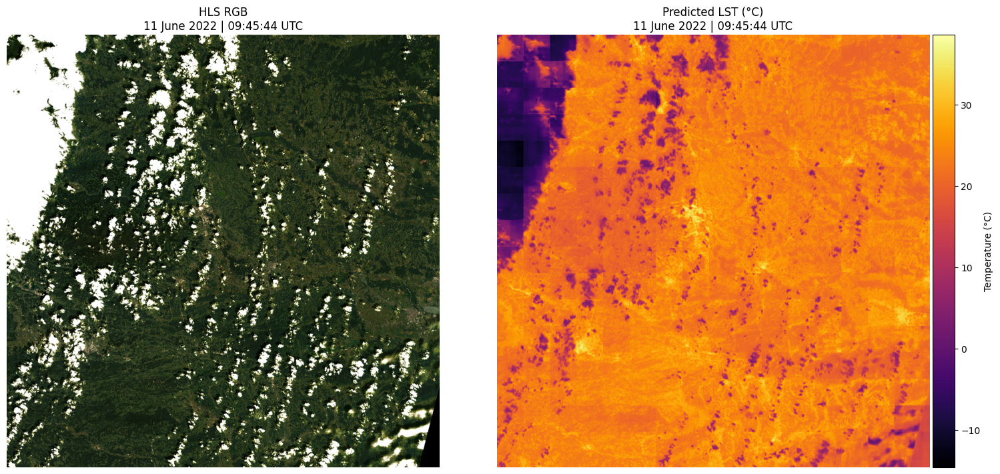

In [16]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from datetime import datetime




# -----------------------------------
# Paths
# -----------------------------------

rgb_stack_path = r"C:\Users\carellano.LEGION5PRO-O3OB\Documents\GitHub\SR_dataaccess\data_hls_graz\model_inputs_dn\HLS.L30.T33TWM.2022162T094544.v2.0.inputs.tif"

pred_path = rgb_stack_path.replace(".inputs.tif", ".pred.tif")



# --------------------------------------------------
# Extract date from filename
# --------------------------------------------------

filename = rgb_stack_path.split("\\")[-1]
date_part = filename.split(".")[3]  # 2022162T094544

year = int(date_part[:4])
julian = int(date_part[4:7])
time_str = date_part.split("T")[1]

date_obj = datetime.strptime(f"{year}{julian}", "%Y%j")
date_clean = date_obj.strftime("%d %B %Y")
time_clean = f"{time_str[:2]}:{time_str[2:4]}:{time_str[4:6]} UTC"

title_date = f"{date_clean} | {time_clean}"

# -----------------------------------
# Load RGB (Bands 3,2,1 = B04,B03,B02)
# -----------------------------------

with rasterio.open(rgb_stack_path) as src:
    red   = src.read(3)
    green = src.read(2)
    blue  = src.read(1)

# Convert DN → reflectance only for display
rgb = np.stack([red, green, blue], axis=-1).astype(np.float32)
rgb = rgb * 0.0001  # apply scale factor for visualization

# Clip to reasonable reflectance range
rgb = np.clip(rgb, 0, 0.3)
rgb = rgb / 0.3  # normalize 0–1 for plotting

# -----------------------------------
# Load prediction
# -----------------------------------

with rasterio.open(pred_path) as src:
    pred = src.read(1)

# -----------------------------------
# Plot side-by-side
# -----------------------------------

fig, axes = plt.subplots(1, 2, figsize=(15, 7), constrained_layout=True)

axes[0].set_aspect("equal")
axes[1].set_aspect("equal")

axes[0].imshow(rgb)
axes[0].set_title(f"HLS RGB\n{title_date}")
axes[0].axis("off")

im = axes[1].imshow(pred, cmap="inferno")
axes[1].set_title(f"Predicted LST (°C)\n{title_date}")
axes[1].axis("off")

divider = make_axes_locatable(axes[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax, label="Temperature (°C)")

plt.show()

# HLS S30

### Find HLS S30


In [18]:
import glob
import os

def find_s30_prefixes(hls_dir, required_bands):
    b02_files = glob.glob(os.path.join(hls_dir, "HLS.S30.*.B02.tif"))
    prefixes = sorted([
        os.path.basename(f).replace(".B02.tif", "")
        for f in b02_files
    ])

    def has_all(prefix):
        return all(
            os.path.exists(os.path.join(hls_dir, f"{prefix}.{b}.tif"))
            for b in required_bands
        )

    prefixes = [p for p in prefixes if has_all(p)]
    return prefixes


# Same band list as L30
bands = ["B02","B03","B04","B05","B06","B07"]

s30_prefixes = find_s30_prefixes(HLS_DIR, bands)

print("✅ S30 acquisitions with full band set:", len(s30_prefixes))
print("First 5:")
for p in s30_prefixes[:5]:
    print(" -", p)


✅ S30 acquisitions with full band set: 0
First 5:
